In [2]:
import numpy as np 
import pandas as pd
import json 
import csv
import nltk
import unicodedata
import re
import sys
from gensim.models.coherencemodel import CoherenceModel
from gensim import corpora, models
from gensim.utils import simple_preprocess
import gensim, spacy
from gensim.models.ldamulticore import LdaMulticore
import re
from gensim.models import Phrases
from gensim.models.phrases import Phraser

import os

In [3]:
# pip install git+https://github.com/rwalk/gsdmm.git

In [4]:
from gsdmm import MovieGroupProcess

In [5]:
df = pd.read_csv("../pos_neg_india.csv")
df

,Unnamed: 0,index,Text,new_text,languages,translated,new_languages,pos_tagged_words,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment
0,0,0,soniya mummy hoti toh covid me magic stick ghu...,soniya mummy hoti toh covid me magic stick ghu...,Unknown,soniya mummy hoti toh covid me magic stick ghu...,Unknown,"[('soniya', 'JJ'), ('mummy', 'NN'), ('hot', 'J...","['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],['death'],subjective,0
1,12,12,is covid ki waja se buht saray logon ne apne p...,is covid ki waja se buht saray logon ne apne p...,Unknown,is covid ki waja se buht saray logon ne apne p...,Unknown,"[('is', 'VBZ'), ('couid', 'JJ'), ('ki', 'NN'),...","['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,2
2,18,18,deaths due covid what is vaccination rate what...,deaths due covid what is vaccination rate what...,"ENGLISH, Unknown",deaths due covid what is vaccination rate what...,"ENGLISH, Unknown","[('deaths', 'NNS'), ('due', 'JJ'), ('couid', '...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
3,28,28,vaccination against covid- 19 is necessity tod...,vaccination against covid- 19 is necessity tod...,ENGLISH,vaccination against covid- 19 is necessity tod...,ENGLISH,"[('vaccination', 'NN'), ('against', 'IN'), ('c...","['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2
4,33,33,very surprising that unvaccinated population &...,very surprising that unvaccinated population &...,ENGLISH,very surprising that unvaccinated population &...,ENGLISH,"[('very', 'RB'), ('surprising', 'JJ'), ('that'...","['surprising', 'vaccinated', 'population', 'yr...","['surprising', 'vaccinated', 'population', 'yr...","['population', 'yrs', 'offline', 'class', 'amp...",subjective,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37618,95179,95179,nature seems have already started working savi...,nature seems have already started working savi...,ENGLISH,nature seems have already started working savi...,ENGLISH,"[('nature', 'NN'), ('seems', 'VBZ'), ('have', ...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
37619,95180,95180,"dear , we #india 🇮🇳has helped this #world incl...","dear , we #india Indiahas helped this #world i...",ENGLISH,"dear , we #india Indiahas helped this #world i...",ENGLISH,"[('dear', 'IN'), ('we', 'PRP'), ('india', 'VBP...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,2
37620,95184,95184,our sincere request state central govt 🙏🙏. ple...,our sincere request state central govt folded_...,ENGLISH,our sincere request state central govt folded_...,ENGLISH,"[('our', 'PRP$'), ('sincere', 'JJ'), ('request...","['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
37621,95185,95185,thanks your appreciation valuable feedback abo...,thanks your appreciation valuable feedback abo...,ENGLISH,thanks your appreciation valuable feedback abo...,ENGLISH,"[('thanks', 'NNS'), ('your', 'PRP$'), ('apprec...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,2


In [6]:
df.drop(columns = ['Unnamed: 0', 'Text', 'index', 'new_text', 'languages', 'new_languages', 'pos_tagged_words'], inplace = True)
df

,translated,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment
0,soniya mummy hoti toh covid me magic stick ghu...,"['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],['death'],subjective,0
1,is covid ki waja se buht saray logon ne apne p...,"['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,2
2,deaths due covid what is vaccination rate what...,"['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
3,vaccination against covid- 19 is necessity tod...,"['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2
4,very surprising that unvaccinated population &...,"['surprising', 'vaccinated', 'population', 'yr...","['surprising', 'vaccinated', 'population', 'yr...","['population', 'yrs', 'offline', 'class', 'amp...",subjective,0
...,...,...,...,...,...,...
37618,nature seems have already started working savi...,"['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
37619,"dear , we #india Indiahas helped this #world i...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,2
37620,our sincere request state central govt folded_...,"['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
37621,thanks your appreciation valuable feedback abo...,"['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,2


In [7]:
df['words_processed_noun'].values[0][0]

'['

In [8]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [9]:
tokens_words_processed_noun = list(sent_to_words(df['words_processed_noun']))

In [10]:
from nltk.corpus import stopwords
stop_list = stopwords.words('english')
high_freq_known_words = ['covid','couid', 'pfizer', 'amp', 'people', 'covidvaccine', 'covishield', 'moderna', 'vaccine', 'vaccinated', 'vaccination', 'vaccines']

stop_list.extend(high_freq_known_words)

test_words_only1 = ['not', 'vaccine', 'covid', 'and', 'vegan', 'cruelty', 'free', 'i', 'use', 'elf', 'cosmetics', 'every', 'day', 'and', 'i', 'love', 'it']
test_stopremoved = [w for w in test_words_only1 if w not in stop_list or w == 'not']
print(test_stopremoved)

['not', 'vegan', 'cruelty', 'free', 'use', 'elf', 'cosmetics', 'every', 'day', 'love']


In [11]:
stop_list

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [12]:
df['words_processed_noun'] = tokens_words_processed_noun

In [13]:
# remove stop words from tokenised_words_only

tokenised_stopremoved = [[w for w in each if w not in stop_list or w == 'not'] for each in tokens_words_processed_noun]
tokenised_stopremoved

[['death'],
 ['hair', 'ply'],
 ['death', 'rate', 'harm', 'harm'],
 ['necessity', 'today', 'scenario', 'problem'],
 ['population',
  'yrs',
  'offline',
  'class',
  'examination',
  'situation',
  'safety',
  'class',
  'examination'],
 ['way', 'thing', 'millennium', 'peril', 'job', 'process', 'retweet'],
 ['symptom', 'example', 'country', 'number', 'death', 'population', 'life'],
 ['follower', 'pledge', 'service', 'humanity'],
 ['case', 'case', 'testing', 'taboo'],
 ['intellectual',
  'education',
  'leader',
  'health',
  'system',
  'pandemic',
  'nation',
  'service'],
 ['agreement', 'student', 'travel', 'guideline'],
 ['system',
  'conversion',
  'appeasement',
  'health',
  'service',
  'infection',
  'rate',
  'death',
  'rate',
  'rate',
  'welfare',
  'isis'],
 ['oppression',
  'yesterday',
  'appointment',
  'wife',
  'today',
  'worker',
  'present',
  'time',
  'money'],
 ['effectiveness',
  'life',
  'number',
  'rajasthan',
  'safetyfirst',
  'thursdayvibe'],
 ['campaign'

In [14]:
df['words_processed_noun'].values[0][0]

'death'

In [15]:
df['tokenised_stopremoved'] = tokenised_stopremoved

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37623 entries, 0 to 37622
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   translated                         37623 non-null  object
 1   words_processed_all                37623 non-null  object
 2   words_processed_noun_adj_verb_adv  37623 non-null  object
 3   words_processed_noun               37623 non-null  object
 4   text_type                          37623 non-null  object
 5   sentiment                          37623 non-null  int64 
 6   tokenised_stopremoved              37623 non-null  object
dtypes: int64(1), object(6)
memory usage: 2.0+ MB


# GSDMM for the topic modeling: 

In [17]:
np.random.seed(0)

In [18]:
df.info() # no empty rows

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37623 entries, 0 to 37622
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   translated                         37623 non-null  object
 1   words_processed_all                37623 non-null  object
 2   words_processed_noun_adj_verb_adv  37623 non-null  object
 3   words_processed_noun               37623 non-null  object
 4   text_type                          37623 non-null  object
 5   sentiment                          37623 non-null  int64 
 6   tokenised_stopremoved              37623 non-null  object
dtypes: int64(1), object(6)
memory usage: 2.0+ MB


In [19]:
df['sentiment'].value_counts()

0    20029
2    17594
Name: sentiment, dtype: int64

In [20]:
positive_df = df[df['sentiment'] == 2]

In [21]:
positive_df

,translated,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment,tokenised_stopremoved
1,is covid ki waja se buht saray logon ne apne p...,"['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","[hair, ply, vaccination]",subjective,2,"[hair, ply]"
2,deaths due covid what is vaccination rate what...,"['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","[death, couid, vaccination, rate, harm, harm]",subjective,2,"[death, rate, harm, harm]"
3,vaccination against covid- 19 is necessity tod...,"['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","[necessity, today, scenario, problem]",subjective,2,"[necessity, today, scenario, problem]"
5,dr. deserved #1 minister's award his exception...,"['deserved', 'one', 'minister', 'award', 'exce...","['deserved', 'way', 'manage', 'thing', 'millen...","[way, thing, millennium, peril, couid, job, va...",subjective,2,"[way, thing, millennium, peril, job, process, ..."
6,"yeah i still do not get why, symptoms are much...","['yeah', 'still', 'not', 'get', 'symptom', 'mu...","['still', 'symptom', 'much', 'less', 'severe',...","[symptom, vaccination, example, country, numbe...",subjective,2,"[symptom, example, country, number, death, pop..."
...,...,...,...,...,...,...,...
37618,nature seems have already started working savi...,"['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","[nature, generation, life, strengthen]",subjective,2,"[nature, generation, life, strengthen]"
37619,"dear , we #india Indiahas helped this #world i...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","[world, kindnessmatter]",subjective,2,"[world, kindnessmatter]"
37620,our sincere request state central govt folded_...,"['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","[request, state, govt, share]",subjective,2,"[request, state, govt, share]"
37621,thanks your appreciation valuable feedback abo...,"['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","[thank, appreciation, feedback]",subjective,2,"[thank, appreciation, feedback]"


In [22]:
positive_df['tokenised_stopremoved'].values[0][0]

'hair'

In [23]:
positive_tokenised_lemmatized = list(sent_to_words(positive_df['tokenised_stopremoved']))

In [24]:
positive_tokenised_lemmatized[0][0]

'hair'

In [25]:
len(positive_tokenised_lemmatized)

17594

In [26]:
def top_words(cluster_word_distribution, top_cluster, values):
    for cluster in top_cluster:
        sort_dicts =sorted(mgp.cluster_word_distribution[cluster].items(), key=lambda k: k[1], reverse=True)[:values]
        print("\nCluster %s : %s"%(cluster,sort_dicts))

### Cluster size: 4

In [115]:
mgp = MovieGroupProcess(K=4, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 12345 clusters with 4 clusters populated
In stage 1: transferred 9656 clusters with 4 clusters populated
In stage 2: transferred 8577 clusters with 4 clusters populated
In stage 3: transferred 8005 clusters with 4 clusters populated
In stage 4: transferred 7318 clusters with 4 clusters populated
In stage 5: transferred 7002 clusters with 4 clusters populated
In stage 6: transferred 6571 clusters with 4 clusters populated
In stage 7: transferred 6358 clusters with 4 clusters populated
In stage 8: transferred 6044 clusters with 4 clusters populated
In stage 9: transferred 5970 clusters with 4 clusters populated
In stage 10: transferred 5879 clusters with 4 clusters populated
In stage 11: transferred 5920 clusters with 4 clusters populated
In stage 12: transferred 5903 clusters with 4 clusters populated
In stage 13: transferred 5720 clusters with 4 clusters populated
In stage 14: transferred 5705 clusters with 4 clusters populated
In stage 15: transferred 5716 clus

In [116]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [4922 2417 5112 5143]

Most important clusters (by number of docs inside): [3 2 0 1]

Cluster 3 : [('virus', 350), ('mask', 314), ('day', 312), ('time', 308), ('dose', 304), ('family', 269), ('today', 262), ('case', 188), ('symptom', 183), ('year', 172)]

Cluster 2 : [('thank', 748), ('today', 702), ('dose', 491), ('center', 308), ('staff', 303), ('time', 286), ('day', 270), ('family', 242), ('help', 208), ('team', 195)]

Cluster 0 : [('country', 534), ('world', 373), ('time', 291), ('day', 257), ('government', 248), ('population', 205), ('citizen', 181), ('state', 180), ('nation', 178), ('thank', 169)]

Cluster 1 : [('student', 241), ('travel', 149), ('country', 148), ('school', 142), ('day', 132), ('staff', 118), ('child', 113), ('time', 107), ('quarantine', 103), ('test', 99)]


In [117]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [118]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [119]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 3,"[necessity, today, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 3,"[way, thing, millennium, peril, job, process, ..."
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, country, number, death, pop..."


In [120]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [121]:
result['Topic']

0        type 4
1        type 1
2        type 3
3        type 3
4        type 3
          ...  
17589    type 3
17590    type 3
17591    type 3
17592    type 2
17593    type 1
Name: Topic, Length: 17594, dtype: object

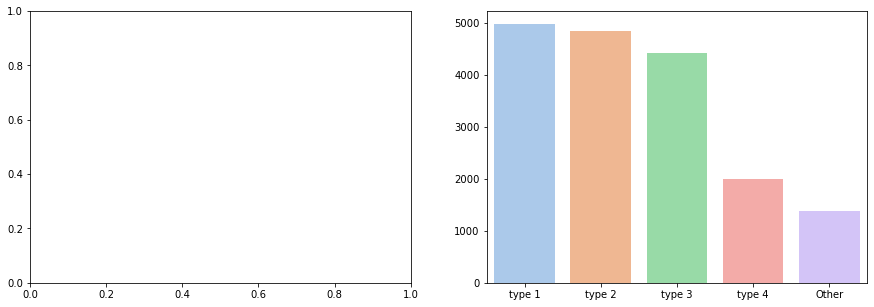

In [122]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [123]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 3,"[necessity, today, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 3,"[way, thing, millennium, peril, job, process, ...",32
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, country, number, death, pop...",39


In [124]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [125]:
result = result.drop('Lemma-text', axis=1)

In [126]:
from wordcloud import WordCloud 

In [127]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

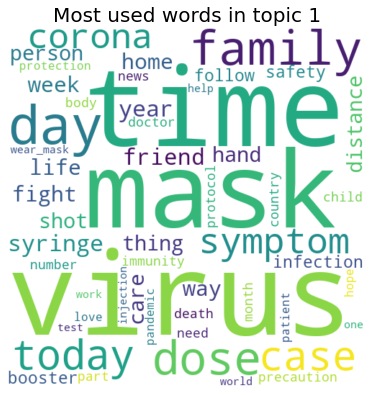

In [128]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

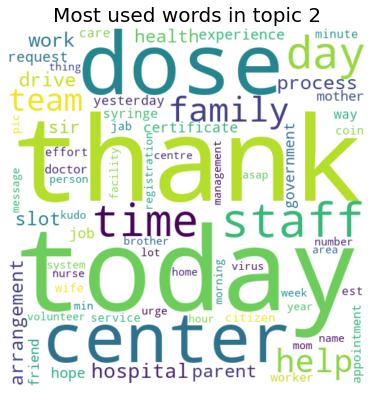

In [129]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

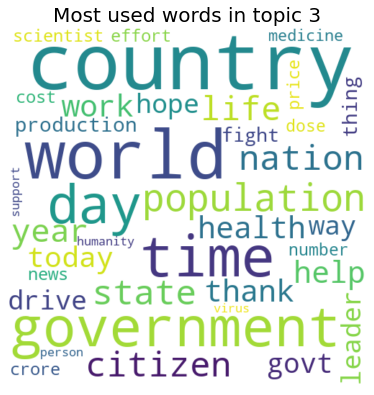

In [130]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

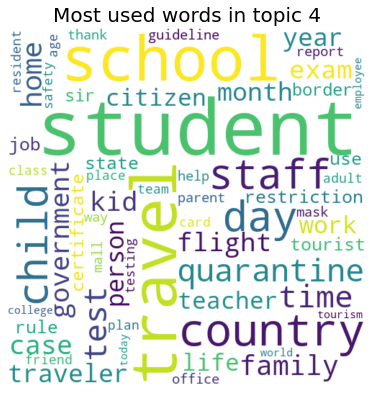

In [131]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

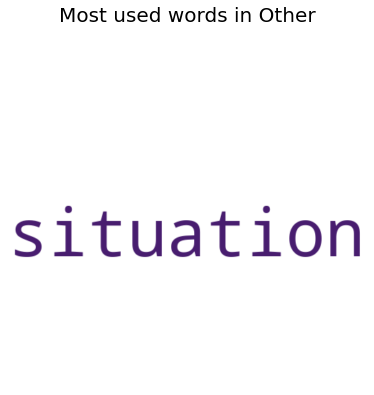

In [132]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 5

In [173]:
mgp = MovieGroupProcess(K=5, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 13060 clusters with 5 clusters populated
In stage 1: transferred 10419 clusters with 5 clusters populated
In stage 2: transferred 9248 clusters with 5 clusters populated
In stage 3: transferred 8671 clusters with 5 clusters populated
In stage 4: transferred 8129 clusters with 5 clusters populated
In stage 5: transferred 7602 clusters with 5 clusters populated
In stage 6: transferred 7136 clusters with 5 clusters populated
In stage 7: transferred 6901 clusters with 5 clusters populated
In stage 8: transferred 6659 clusters with 5 clusters populated
In stage 9: transferred 6364 clusters with 5 clusters populated
In stage 10: transferred 6392 clusters with 5 clusters populated
In stage 11: transferred 6156 clusters with 5 clusters populated
In stage 12: transferred 6213 clusters with 5 clusters populated
In stage 13: transferred 6144 clusters with 5 clusters populated
In stage 14: transferred 5999 clusters with 5 clusters populated
In stage 15: transferred 5866 clu

In [174]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [5979 1084 1816 4663 4052]

Most important clusters (by number of docs inside): [0 3 4 2 1]

Cluster 0 : [('today', 787), ('thank', 750), ('dose', 532), ('family', 402), ('time', 317), ('day', 293), ('center', 219), ('staff', 219), ('friend', 197), ('student', 195)]

Cluster 3 : [('mask', 332), ('day', 321), ('virus', 319), ('time', 316), ('country', 232), ('case', 207), ('dose', 185), ('family', 175), ('corona', 160), ('travel', 155)]

Cluster 4 : [('country', 492), ('world', 326), ('time', 232), ('government', 221), ('day', 188), ('population', 169), ('nation', 158), ('year', 157), ('citizen', 148), ('state', 143)]

Cluster 2 : [('staff', 169), ('center', 127), ('certificate', 114), ('today', 108), ('dose', 91), ('help', 85), ('time', 84), ('hospital', 81), ('slot', 80), ('day', 78)]

Cluster 1 : [('day', 91), ('symptom', 52), ('needle', 48), ('injection', 45), ('time', 43), ('dose', 40), ('hour', 38), ('fever', 38), ('syringe', 35), ('pain', 35)]


In [175]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [176]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [177]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 1,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 2,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, today, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 3,"[way, thing, millennium, peril, job, process, ..."
4,"yeah i still do not get why, symptoms are much...",type 2,"[symptom, example, country, number, death, pop..."


In [178]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [179]:
result['Topic']

0        type 1
1        type 2
2        type 1
3        type 3
4        type 2
          ...  
17589    type 3
17590    type 3
17591    type 3
17592    type 1
17593    type 2
Name: Topic, Length: 17594, dtype: object

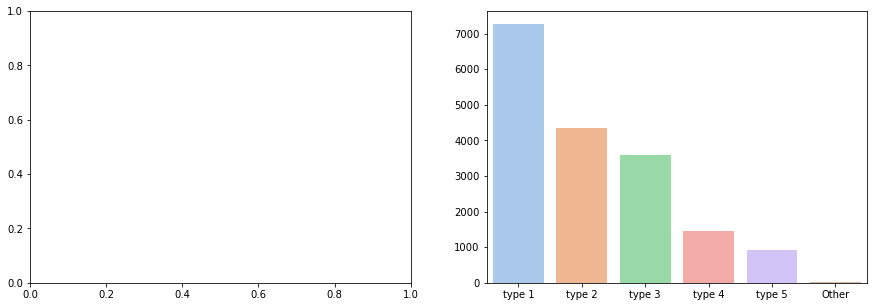

In [180]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [181]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 1,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 2,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, today, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 3,"[way, thing, millennium, peril, job, process, ...",32
4,"yeah i still do not get why, symptoms are much...",type 2,"[symptom, example, country, number, death, pop...",39


In [182]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [183]:
result = result.drop('Lemma-text', axis=1)

In [184]:
from wordcloud import WordCloud 

In [185]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

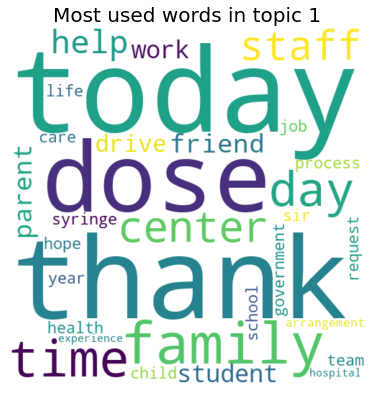

In [186]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

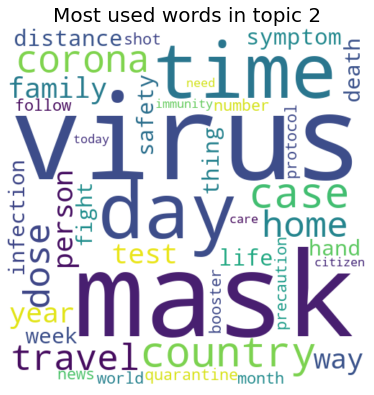

In [187]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

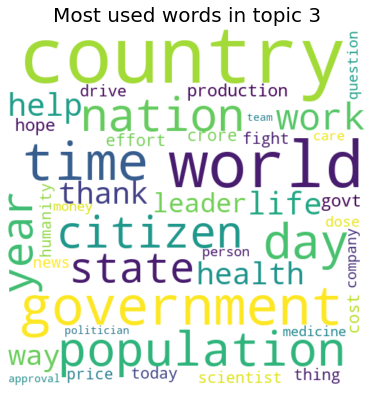

In [188]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

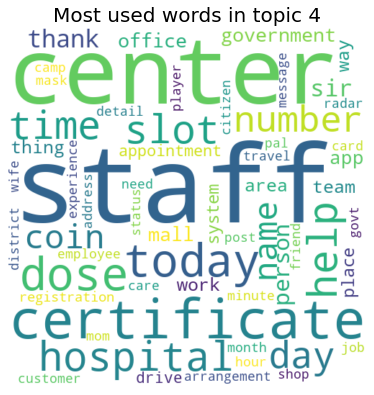

In [189]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

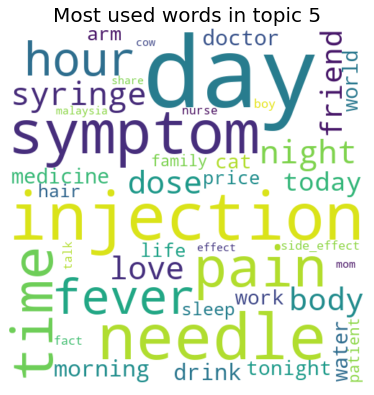

In [190]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

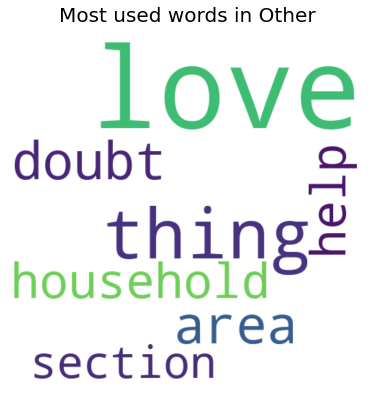

In [191]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 6

In [192]:
mgp = MovieGroupProcess(K=6, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 13640 clusters with 6 clusters populated
In stage 1: transferred 10812 clusters with 6 clusters populated
In stage 2: transferred 9510 clusters with 6 clusters populated
In stage 3: transferred 8631 clusters with 6 clusters populated
In stage 4: transferred 7899 clusters with 6 clusters populated
In stage 5: transferred 7451 clusters with 6 clusters populated
In stage 6: transferred 7145 clusters with 6 clusters populated
In stage 7: transferred 6892 clusters with 6 clusters populated
In stage 8: transferred 6669 clusters with 6 clusters populated
In stage 9: transferred 6549 clusters with 6 clusters populated
In stage 10: transferred 6481 clusters with 6 clusters populated
In stage 11: transferred 6432 clusters with 6 clusters populated
In stage 12: transferred 6403 clusters with 6 clusters populated
In stage 13: transferred 6270 clusters with 6 clusters populated
In stage 14: transferred 6218 clusters with 6 clusters populated
In stage 15: transferred 6132 clu

In [193]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [ 410 4415 5376 2191 1051 4151]

Most important clusters (by number of docs inside): [2 1 5 3 4 0]

Cluster 2 : [('country', 464), ('thank', 400), ('today', 337), ('time', 299), ('world', 298), ('government', 262), ('work', 237), ('day', 223), ('citizen', 218), ('drive', 211)]

Cluster 1 : [('today', 629), ('dose', 513), ('thank', 510), ('day', 323), ('family', 275), ('time', 249), ('center', 209), ('staff', 197), ('friend', 165), ('process', 161)]

Cluster 5 : [('virus', 336), ('time', 307), ('mask', 302), ('day', 244), ('case', 187), ('dose', 184), ('corona', 176), ('life', 146), ('symptom', 135), ('today', 135)]

Cluster 3 : [('country', 197), ('day', 155), ('travel', 120), ('time', 104), ('world', 98), ('government', 96), ('quarantine', 91), ('year', 81), ('price', 78), ('nation', 76)]

Cluster 4 : [('student', 186), ('school', 123), ('staff', 107), ('child', 104), ('exam', 61), ('teacher', 51), ('kid', 50), ('mall', 47), ('parent', 36), ('life', 36)

In [194]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [195]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [196]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, today, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 2,"[way, thing, millennium, peril, job, process, ..."
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, country, number, death, pop..."


In [197]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [198]:
result['Topic']

0        type 4
1        type 3
2        type 1
3        type 2
4        type 3
          ...  
17589    type 1
17590    type 3
17591    type 1
17592    type 2
17593    type 3
Name: Topic, Length: 17594, dtype: object

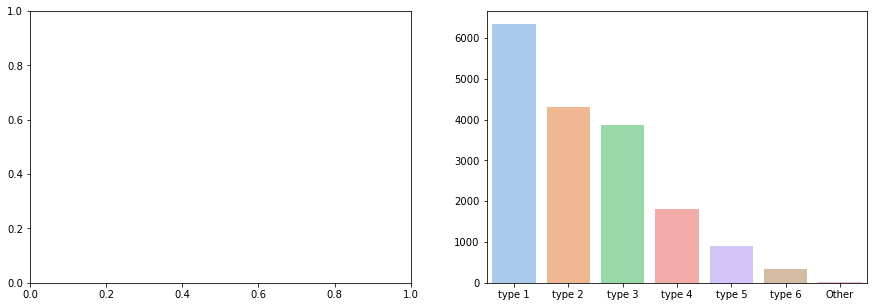

In [199]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [200]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, today, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 2,"[way, thing, millennium, peril, job, process, ...",32
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, country, number, death, pop...",39


In [201]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [202]:
result = result.drop('Lemma-text', axis=1)

In [203]:
from wordcloud import WordCloud 

In [204]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

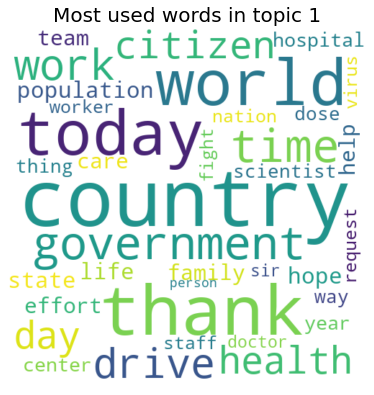

In [205]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

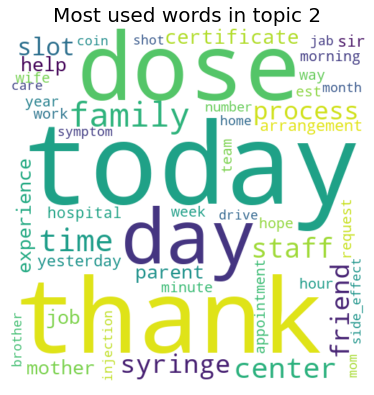

In [206]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

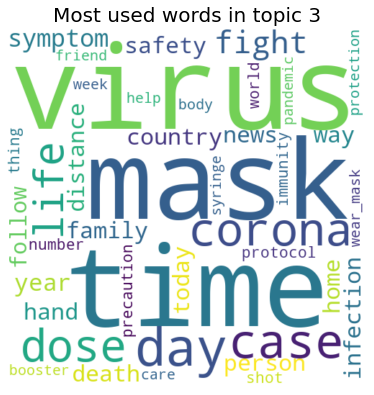

In [207]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

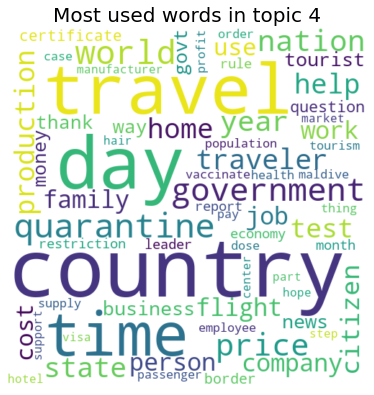

In [208]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

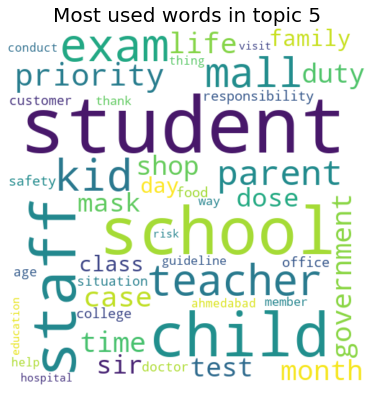

In [209]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

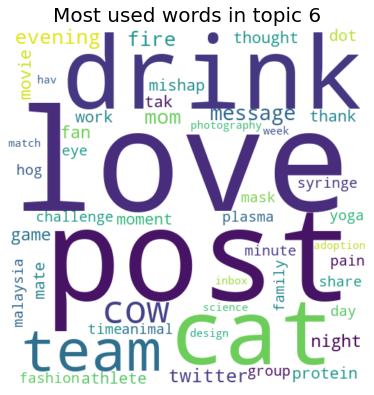

In [210]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

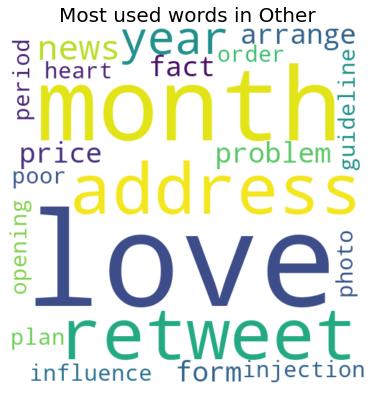

In [211]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 7

In [213]:
mgp = MovieGroupProcess(K=7, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 14149 clusters with 7 clusters populated
In stage 1: transferred 11197 clusters with 7 clusters populated
In stage 2: transferred 9936 clusters with 7 clusters populated
In stage 3: transferred 9021 clusters with 7 clusters populated
In stage 4: transferred 8382 clusters with 7 clusters populated
In stage 5: transferred 7978 clusters with 7 clusters populated
In stage 6: transferred 7607 clusters with 7 clusters populated
In stage 7: transferred 7328 clusters with 7 clusters populated
In stage 8: transferred 7182 clusters with 7 clusters populated
In stage 9: transferred 6873 clusters with 7 clusters populated
In stage 10: transferred 6754 clusters with 7 clusters populated
In stage 11: transferred 6639 clusters with 7 clusters populated
In stage 12: transferred 6530 clusters with 7 clusters populated
In stage 13: transferred 6368 clusters with 7 clusters populated
In stage 14: transferred 6354 clusters with 7 clusters populated
In stage 15: transferred 6344 clu

In [214]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [1084 5151 3604  113 4352  825 2465]

Most important clusters (by number of docs inside): [1 4 2 6 0 5 3]

Cluster 1 : [('today', 734), ('thank', 724), ('dose', 521), ('staff', 317), ('center', 303), ('family', 293), ('time', 283), ('day', 277), ('process', 181), ('help', 180)]

Cluster 4 : [('country', 511), ('world', 368), ('time', 295), ('day', 233), ('government', 209), ('population', 205), ('today', 196), ('year', 165), ('thank', 164), ('citizen', 157)]

Cluster 2 : [('day', 312), ('student', 245), ('time', 240), ('child', 197), ('country', 191), ('case', 183), ('family', 168), ('school', 159), ('travel', 159), ('year', 154)]

Cluster 6 : [('virus', 263), ('mask', 254), ('corona', 134), ('dose', 130), ('syringe', 116), ('fight', 112), ('distance', 111), ('family', 107), ('hand', 106), ('today', 104)]

Cluster 0 : [('government', 63), ('state', 56), ('price', 49), ('help', 47), ('company', 47), ('govt', 45), ('cost', 42), ('country', 41), ('time', 40

In [215]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [216]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [217]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 3,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 2,"[necessity, today, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 5,"[way, thing, millennium, peril, job, process, ..."
4,"yeah i still do not get why, symptoms are much...",type 2,"[symptom, example, country, number, death, pop..."


In [218]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [219]:
result['Topic']

0        type 3
1        type 3
2        type 2
3        type 5
4        type 2
          ...  
17589    type 2
17590    type 5
17591    type 2
17592    type 1
17593    type 4
Name: Topic, Length: 17594, dtype: object

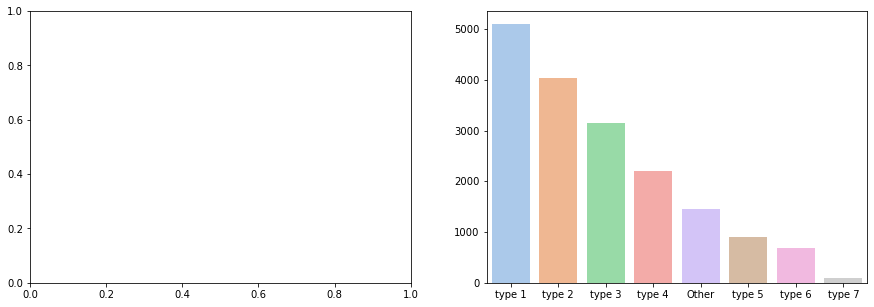

In [220]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [221]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 3,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 2,"[necessity, today, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 5,"[way, thing, millennium, peril, job, process, ...",32
4,"yeah i still do not get why, symptoms are much...",type 2,"[symptom, example, country, number, death, pop...",39


In [222]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [223]:
result = result.drop('Lemma-text', axis=1)

In [224]:
from wordcloud import WordCloud 

In [225]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

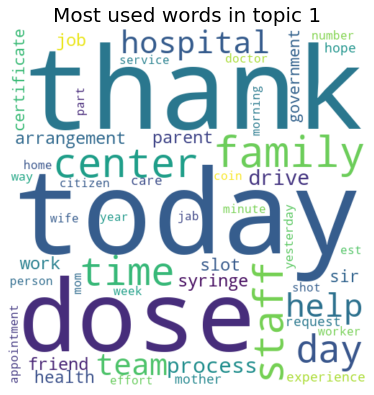

In [226]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

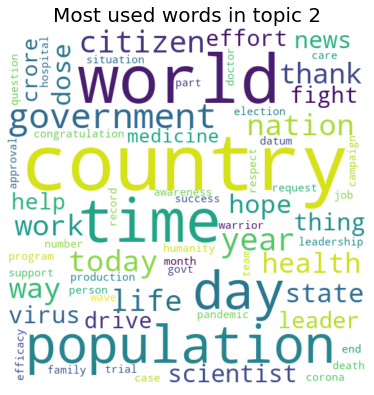

In [227]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

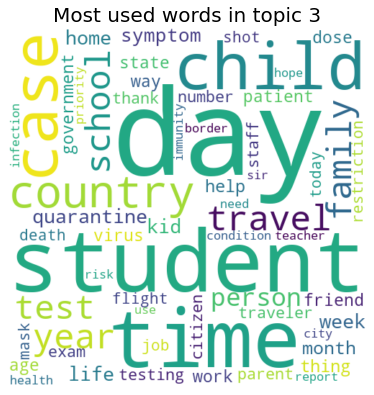

In [228]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

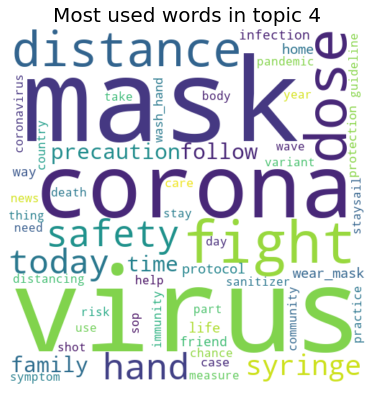

In [229]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

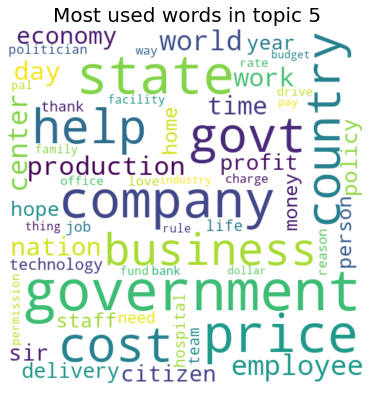

In [230]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

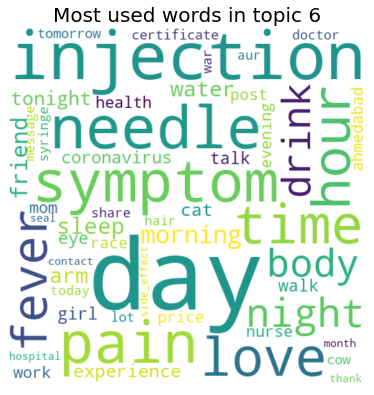

In [231]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

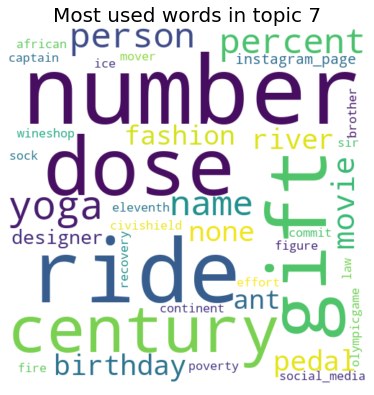

In [232]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

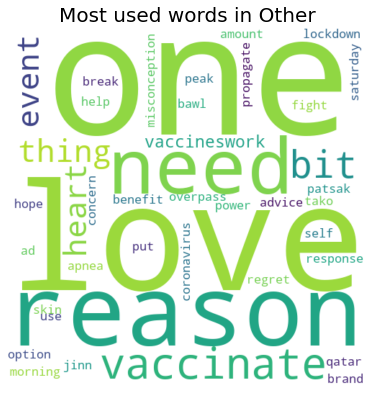

In [233]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 8

In [ ]:
mgp = MovieGroupProcess(K=8, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In [235]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [5698  405  153 3751 4089 1683 1306  509]

Most important clusters (by number of docs inside): [0 4 3 5 6 7 1 2]

Cluster 0 : [('today', 779), ('thank', 756), ('dose', 526), ('day', 355), ('time', 340), ('family', 331), ('center', 298), ('staff', 238), ('help', 207), ('drive', 190)]

Cluster 4 : [('country', 485), ('world', 337), ('time', 238), ('day', 208), ('government', 206), ('population', 176), ('state', 166), ('citizen', 165), ('nation', 157), ('work', 138)]

Cluster 3 : [('virus', 328), ('mask', 314), ('time', 246), ('dose', 217), ('day', 212), ('corona', 176), ('case', 171), ('today', 151), ('symptom', 139), ('family', 134)]

Cluster 5 : [('student', 228), ('school', 164), ('child', 154), ('staff', 114), ('kid', 95), ('life', 87), ('family', 83), ('health', 78), ('country', 70), ('sir', 67)]

Cluster 6 : [('day', 119), ('travel', 118), ('country', 113), ('quarantine', 101), ('time', 74), ('family', 71), ('home', 71), ('traveler', 66), ('test', 57

In [236]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [237]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [238]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 3,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 4,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 2,"[necessity, today, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 2,"[way, thing, millennium, peril, job, process, ..."
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, country, number, death, pop..."


In [239]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [240]:
result['Topic']

0        type 3
1        type 4
2        type 2
3        type 2
4        type 3
          ...  
17589    type 2
17590    type 3
17591    type 2
17592    type 1
17593    type 3
Name: Topic, Length: 17594, dtype: object

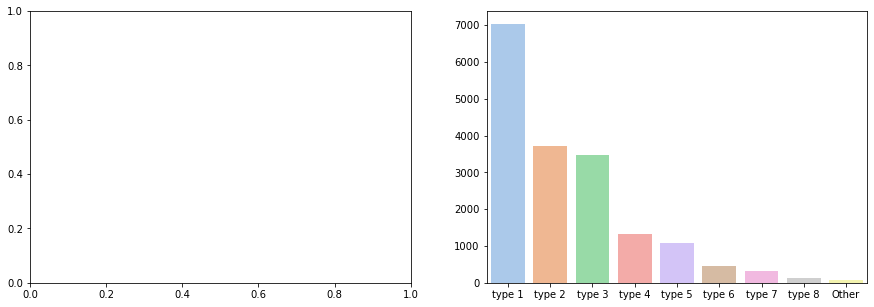

In [241]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [242]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 3,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 4,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 2,"[necessity, today, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 2,"[way, thing, millennium, peril, job, process, ...",32
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, country, number, death, pop...",39


In [243]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [244]:
result = result.drop('Lemma-text', axis=1)

In [245]:
from wordcloud import WordCloud 

In [246]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

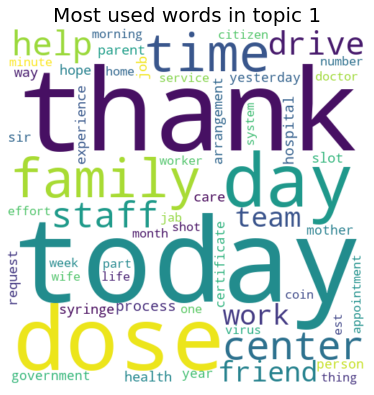

In [247]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

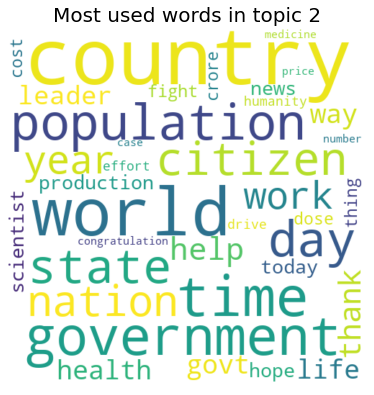

In [248]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

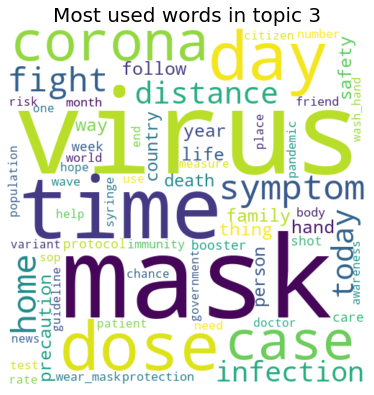

In [249]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

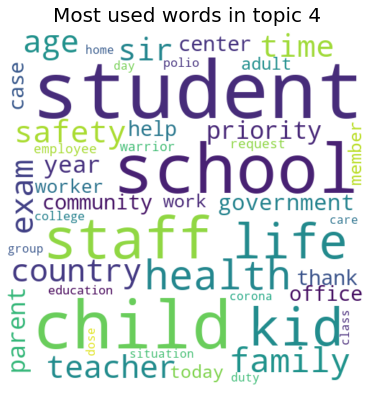

In [250]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

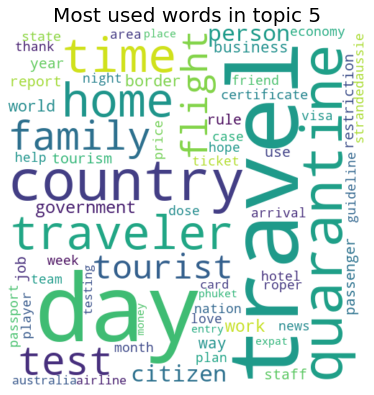

In [251]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

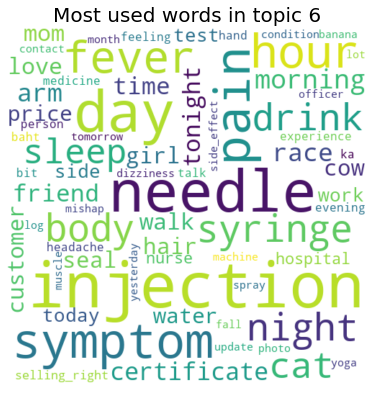

In [252]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

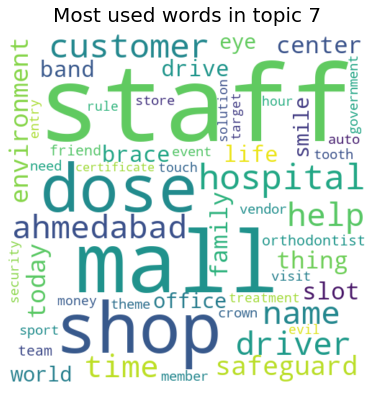

In [253]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

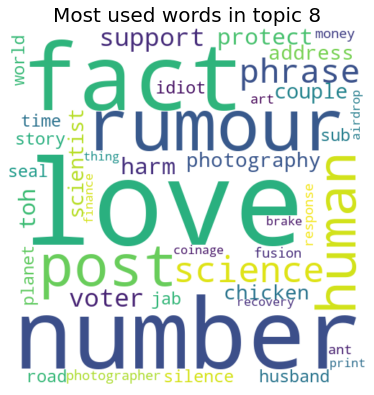

In [254]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

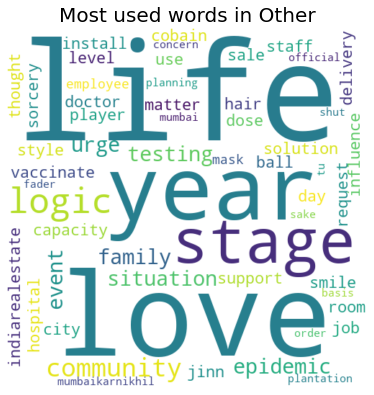

In [255]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 9

In [76]:
mgp = MovieGroupProcess(K=9, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 14755 clusters with 9 clusters populated
In stage 1: transferred 11757 clusters with 9 clusters populated
In stage 2: transferred 10434 clusters with 9 clusters populated
In stage 3: transferred 9617 clusters with 9 clusters populated
In stage 4: transferred 9008 clusters with 9 clusters populated
In stage 5: transferred 8391 clusters with 9 clusters populated
In stage 6: transferred 8031 clusters with 9 clusters populated
In stage 7: transferred 7535 clusters with 9 clusters populated
In stage 8: transferred 7316 clusters with 9 clusters populated
In stage 9: transferred 7184 clusters with 9 clusters populated
In stage 10: transferred 6977 clusters with 9 clusters populated
In stage 11: transferred 6760 clusters with 9 clusters populated
In stage 12: transferred 6597 clusters with 9 clusters populated
In stage 13: transferred 6643 clusters with 9 clusters populated
In stage 14: transferred 6454 clusters with 9 clusters populated
In stage 15: transferred 6431 cl

In [77]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [ 206  656 4475  112  154  166 3593 5410 2822]

Most important clusters (by number of docs inside): [7 2 6 8 1 0 5 4 3]

Cluster 7 : [('thank', 646), ('today', 578), ('dose', 416), ('staff', 342), ('day', 339), ('center', 318), ('time', 314), ('family', 313), ('help', 233), ('hospital', 211)]

Cluster 2 : [('country', 504), ('world', 339), ('time', 269), ('government', 253), ('day', 236), ('population', 179), ('thank', 175), ('state', 174), ('nation', 170), ('work', 169)]

Cluster 6 : [('mask', 329), ('virus', 291), ('time', 242), ('case', 185), ('corona', 169), ('country', 153), ('day', 135), ('distance', 124), ('home', 122), ('family', 122)]

Cluster 8 : [('today', 316), ('dose', 293), ('day', 239), ('syringe', 165), ('family', 163), ('thank', 148), ('symptom', 134), ('time', 133), ('year', 109), ('virus', 108)]

Cluster 1 : [('student', 189), ('school', 115), ('child', 96), ('exam', 62), ('life', 50), ('kid', 45), ('teacher', 43), ('government', 33), 

In [78]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [79]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [80]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 1,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, today, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 2,"[way, thing, millennium, peril, job, process, ..."
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, country, number, death, pop..."


In [81]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [82]:
result['Topic']

0        type 1
1        type 3
2        type 1
3        type 2
4        type 3
          ...  
17589    type 4
17590    type 2
17591    type 2
17592    type 1
17593    type 3
Name: Topic, Length: 17594, dtype: object

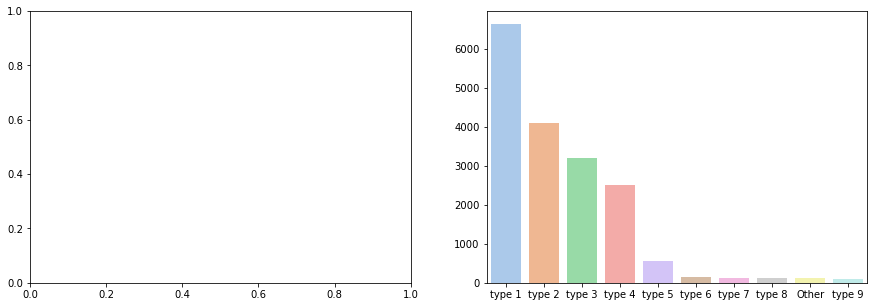

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [84]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 1,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, today, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 2,"[way, thing, millennium, peril, job, process, ...",32
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, country, number, death, pop...",39


In [85]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [86]:
result = result.drop('Lemma-text', axis=1)

In [87]:
from wordcloud import WordCloud 

In [88]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

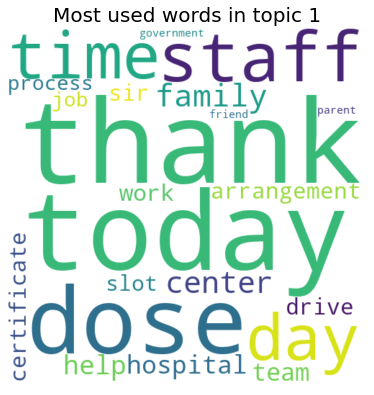

In [89]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

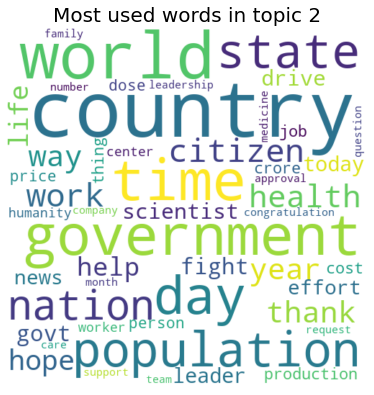

In [90]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

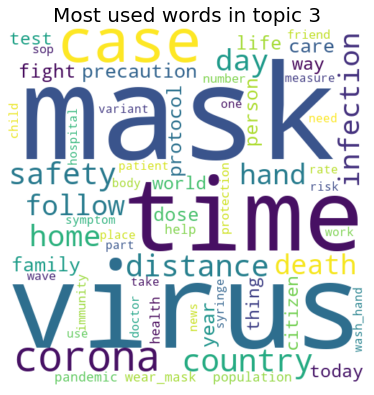

In [91]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

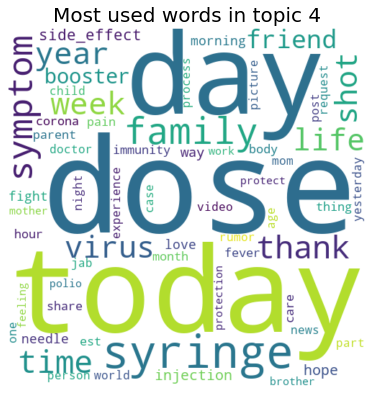

In [92]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

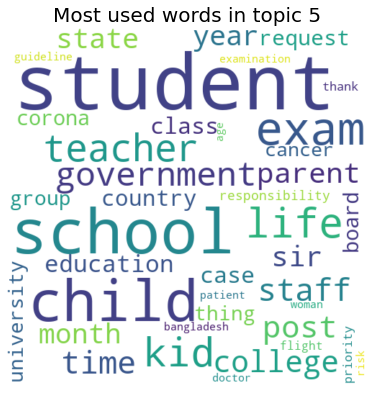

In [93]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

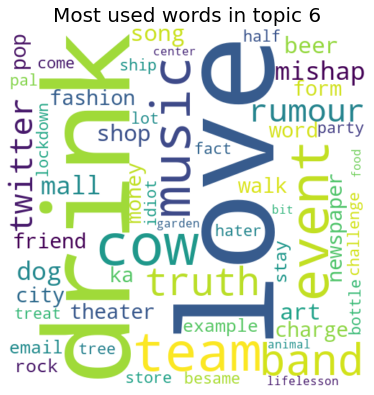

In [94]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

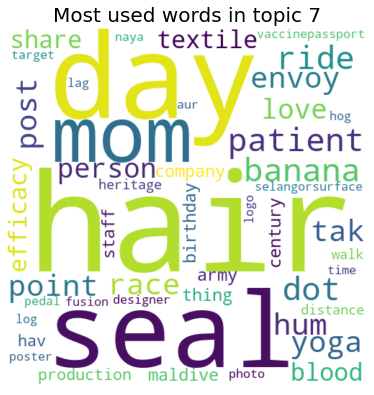

In [95]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

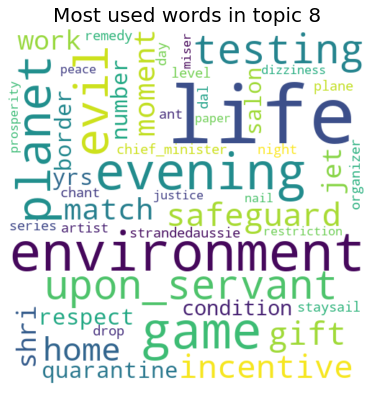

In [96]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

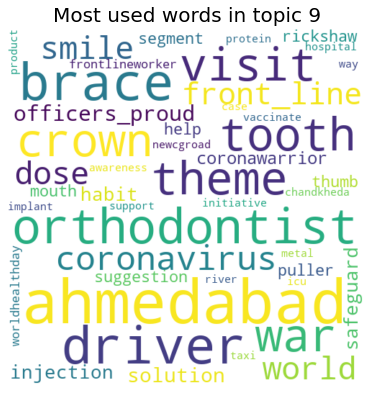

In [97]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

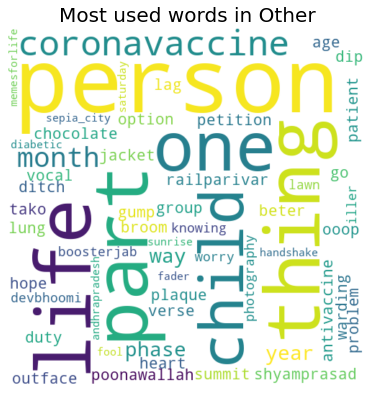

In [98]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 10

In [52]:
mgp = MovieGroupProcess(K=10, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 14906 clusters with 10 clusters populated
In stage 1: transferred 11952 clusters with 10 clusters populated
In stage 2: transferred 10489 clusters with 10 clusters populated
In stage 3: transferred 9704 clusters with 10 clusters populated
In stage 4: transferred 9155 clusters with 10 clusters populated
In stage 5: transferred 8661 clusters with 10 clusters populated
In stage 6: transferred 8271 clusters with 10 clusters populated
In stage 7: transferred 8059 clusters with 10 clusters populated
In stage 8: transferred 7795 clusters with 10 clusters populated
In stage 9: transferred 7523 clusters with 10 clusters populated
In stage 10: transferred 7224 clusters with 10 clusters populated
In stage 11: transferred 7092 clusters with 10 clusters populated
In stage 12: transferred 6893 clusters with 10 clusters populated
In stage 13: transferred 6580 clusters with 10 clusters populated
In stage 14: transferred 6490 clusters with 10 clusters populated
In stage 15: tran

In [53]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [  51 5715 1693   81  186 4191 1048  162   90 4377]

Most important clusters (by number of docs inside): [1 9 5 2 6 4 7 8 3 0]

Cluster 1 : [('today', 790), ('thank', 748), ('dose', 551), ('family', 355), ('staff', 350), ('center', 328), ('time', 312), ('day', 306), ('help', 223), ('hospital', 216)]

Cluster 9 : [('country', 502), ('world', 336), ('time', 277), ('day', 246), ('government', 237), ('population', 189), ('state', 180), ('nation', 165), ('work', 161), ('citizen', 159)]

Cluster 5 : [('virus', 344), ('mask', 309), ('time', 233), ('dose', 228), ('case', 185), ('corona', 183), ('day', 177), ('family', 168), ('today', 167), ('country', 150)]

Cluster 2 : [('student', 231), ('school', 135), ('travel', 132), ('country', 131), ('child', 117), ('time', 108), ('day', 107), ('quarantine', 91), ('test', 83), ('home', 70)]

Cluster 6 : [('day', 127), ('injection', 55), ('time', 51), ('needle', 48), ('symptom', 47), ('pain', 45), ('syringe', 44), ('night'

In [54]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9',
               'type 10'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [55]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [56]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 1,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, today, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 2,"[way, thing, millennium, peril, job, process, ..."
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, country, number, death, pop..."


In [57]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [58]:
result['Topic']

0        type 1
1        type 3
2        type 1
3        type 2
4        type 3
          ...  
17589    type 2
17590    type 2
17591    type 2
17592    type 1
17593    type 3
Name: Topic, Length: 17594, dtype: object

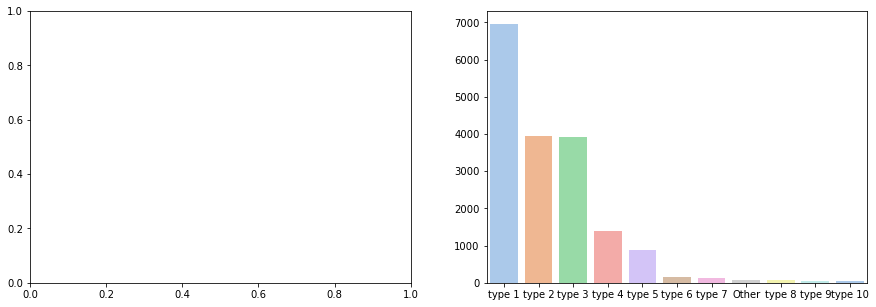

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [60]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 1,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, today, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 2,"[way, thing, millennium, peril, job, process, ...",32
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, country, number, death, pop...",39


In [61]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [62]:
result = result.drop('Lemma-text', axis=1)

In [63]:
from wordcloud import WordCloud 

In [64]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

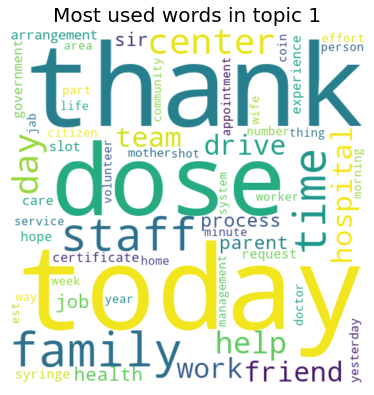

In [65]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

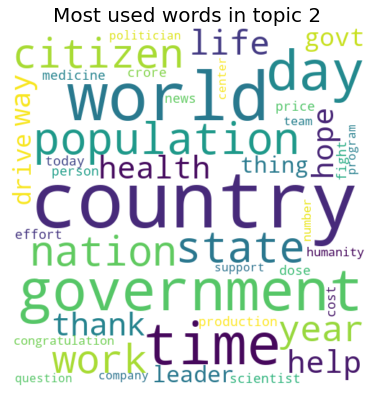

In [66]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

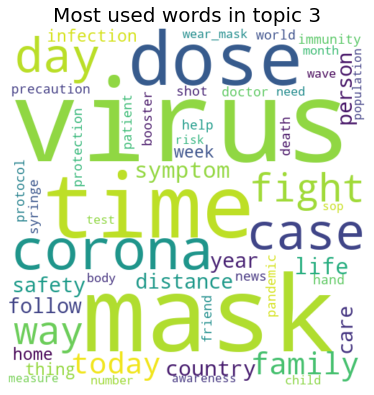

In [67]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

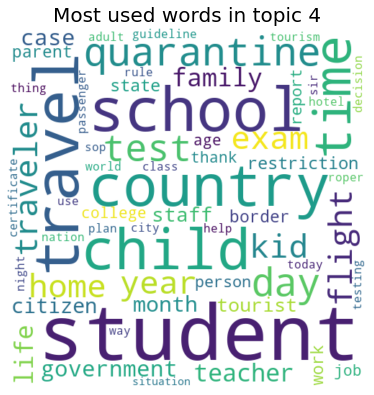

In [68]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

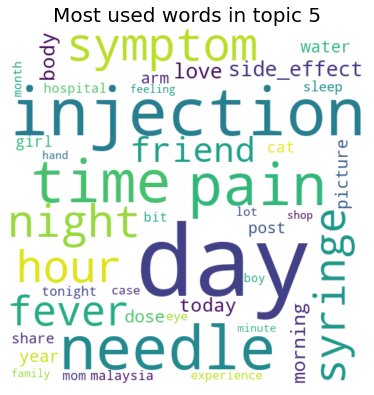

In [69]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

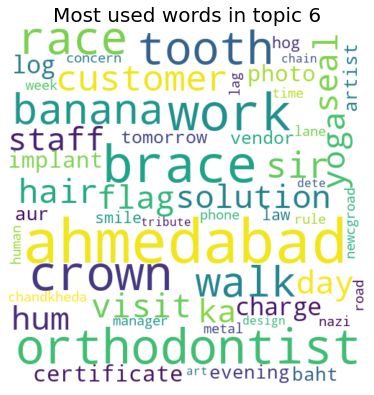

In [70]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

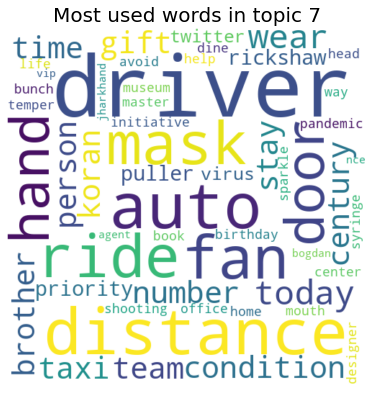

In [71]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

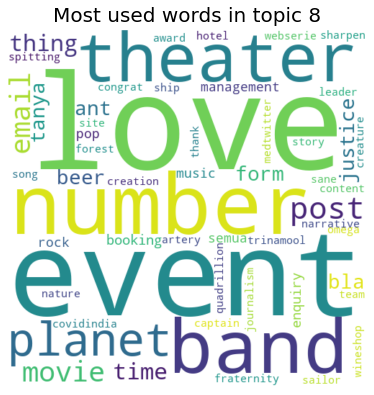

In [72]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

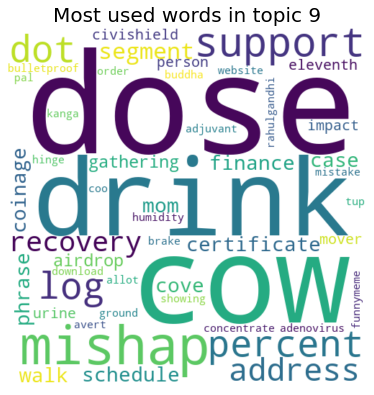

In [73]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

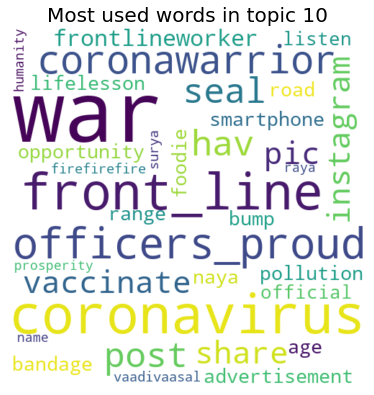

In [74]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 10'], title="Most used words in topic 10")

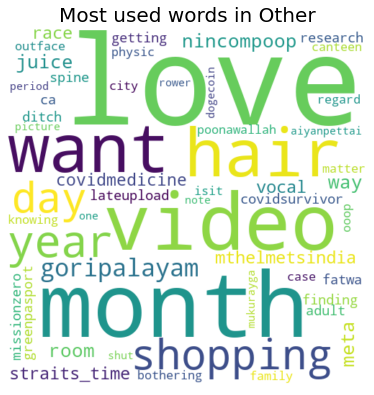

In [75]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")